**Downloading the dataset and unzip**


In [1]:
!wget https://archive.ics.uci.edu/static/public/908/realwaste.zip

--2024-12-11 06:52:41--  https://archive.ics.uci.edu/static/public/908/realwaste.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified
Saving to: ‘realwaste.zip’

realwaste.zip           [     <=>            ] 656.65M  50.7MB/s    in 15s     

2024-12-11 06:52:56 (45.3 MB/s) - ‘realwaste.zip’ saved [688545323]



In [2]:
!unzip /content/realwaste.zip -d /content/dataset

Archive:  /content/realwaste.zip
797f4fca27a3a85e4c27131cdb7d9a9a5d72c494
   creating: /content/dataset/realwaste-main/
  inflating: /content/dataset/realwaste-main/README.md  
   creating: /content/dataset/realwaste-main/RealWaste/
   creating: /content/dataset/realwaste-main/RealWaste/Cardboard/
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_1.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_10.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_100.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_101.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_102.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_103.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_104.jpg  
  inflating: /content/dataset/realwaste-main/RealWaste/Cardboard/Cardboard_105.jpg  
  inflating: /content/da

In [3]:
!apt-get install tree

!tree /content/dataset

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 0s (151 kB/s)
Selecting previously unselected package tree.
(Reading database ... 123632 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...
/content/dataset
└── realwaste-main
    ├── README.md
    └── RealWaste
        ├── Cardboard
        │   ├── Cardboard_100.jpg
        │   ├── Cardboard_101.jpg
        │   ├── Cardboard_102.jpg
        │   ├── Cardboard_103.jpg
        │   ├── Cardboard_104.jpg
        │   ├── Cardboar

In [4]:
import os

def count_images_in_folders(root_path):
    """
    Count the number of image files in each subfolder under the given root directory.

    Parameters:
    - root_path: The directory containing class subfolders.

    Returns:
    - A dictionary with folder names as keys and image counts as values.
    """
    folder_counts = {}

    # Iterate through each subfolder
    for folder in os.listdir(root_path):
        folder_path = os.path.join(root_path, folder)

        # Check if it's a directory
        if os.path.isdir(folder_path):
            # Count files with image extensions
            count = sum(
                1 for file in os.listdir(folder_path)
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))
            )
            folder_counts[folder] = count

    return folder_counts


if __name__ == "__main__":
    root_path = "/content/dataset/realwaste-main/RealWaste"
    counts = count_images_in_folders(root_path)

    for folder, count in counts.items():
        print(f"{folder}: {count} images")


Plastic: 921 images
Metal: 790 images
Miscellaneous Trash: 495 images
Vegetation: 436 images
Food Organics: 411 images
Paper: 500 images
Cardboard: 461 images
Glass: 420 images
Textile Trash: 318 images


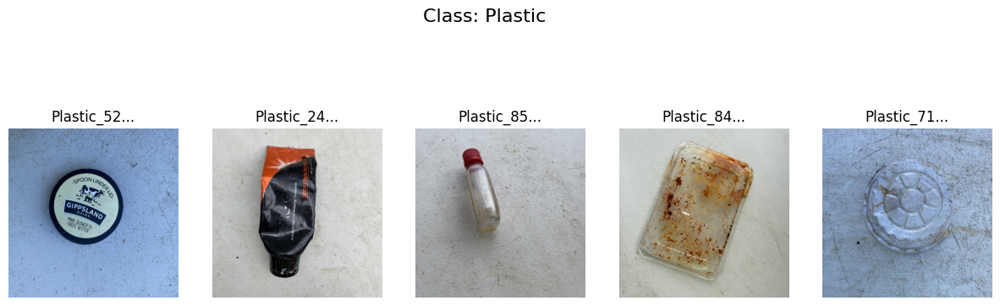

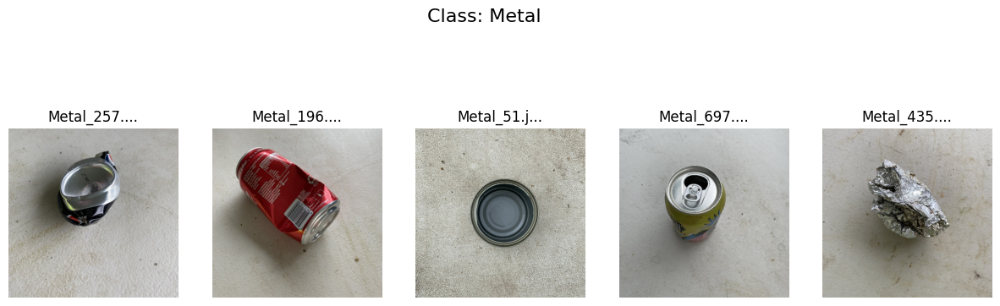

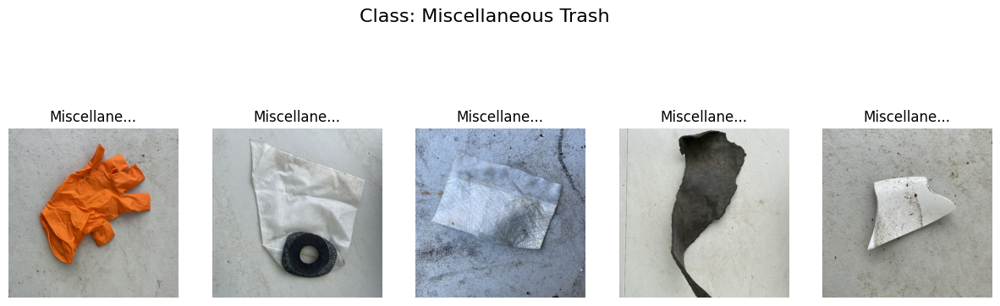

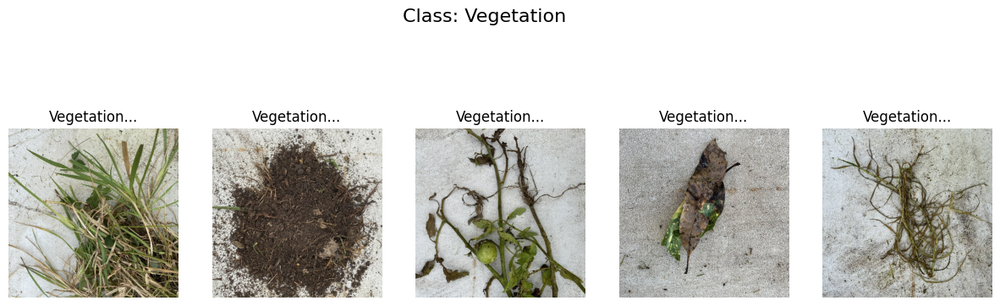

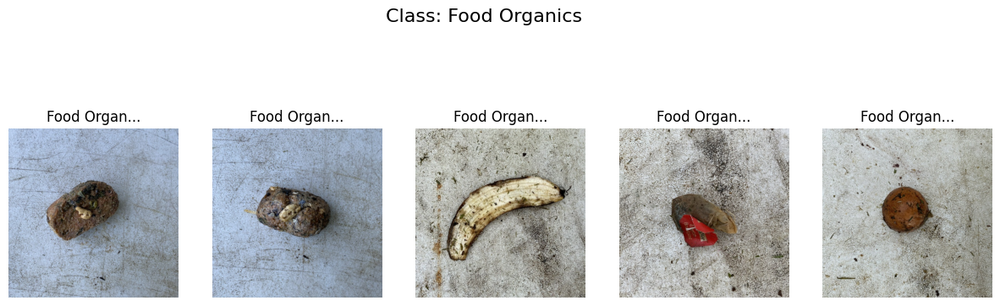

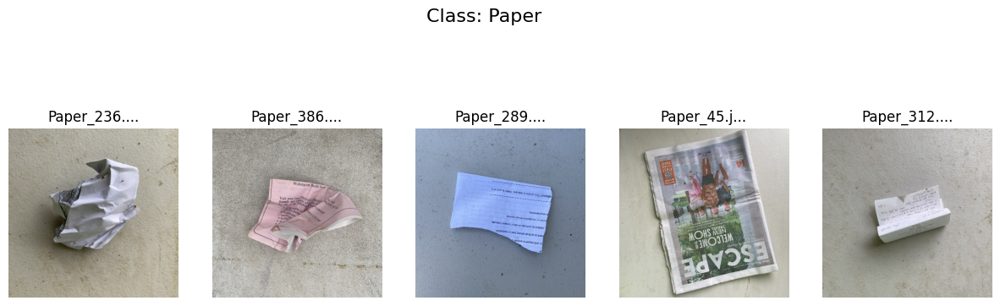

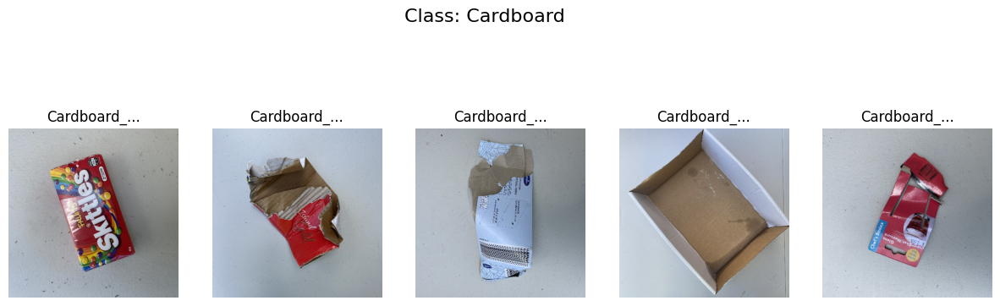

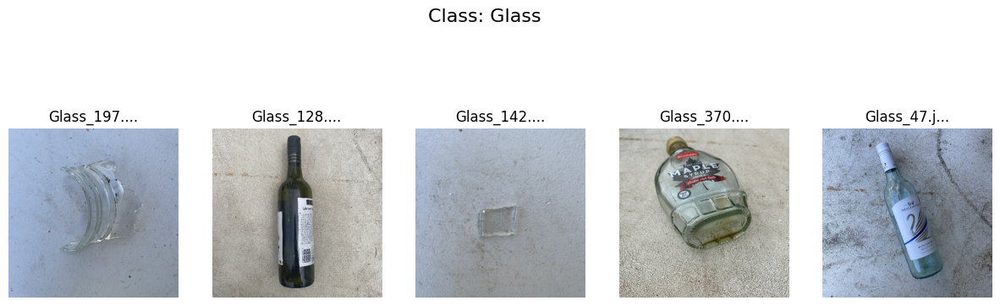

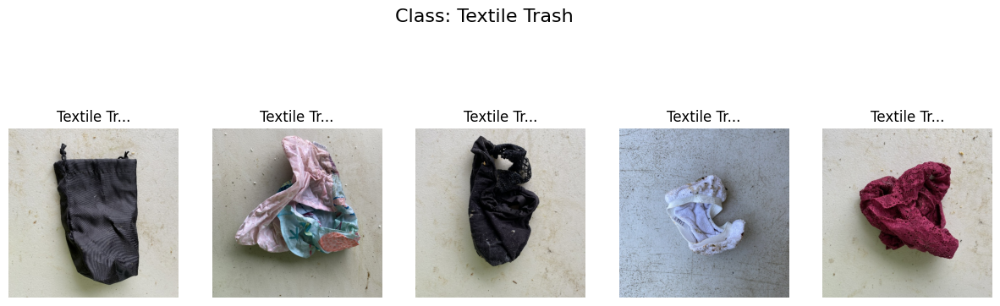

In [5]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def visualize_random_images(root_path, num_images=5):
    """
    Visualize a specified number of random images from each class folder.

    Parameters:
    - root_path: The directory containing class subfolders.
    - num_images: The number of images to display per class.
    """
    # List all class folders
    class_folders = [folder for folder in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, folder))]

    for class_name in class_folders:
        class_path = os.path.join(root_path, class_name)
        image_files = [
            f for f in os.listdir(class_path)
            if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))
        ]

        # Select random images
        random_images = random.sample(image_files, min(num_images, len(image_files)))

        # Plot the images
        plt.figure(figsize=(15, 5))
        plt.suptitle(f"Class: {class_name}", fontsize=16)

        for i, image_name in enumerate(random_images):
            image_path = os.path.join(class_path, image_name)
            image = Image.open(image_path)

            plt.subplot(1, num_images, i + 1)
            plt.imshow(image)
            plt.axis("off")
            plt.title(f"{image_name[:10]}...")  # Truncate title if too long

        plt.show()


if __name__ == "__main__":
    dataset_path = "/content/dataset/realwaste-main/RealWaste"
    visualize_random_images(dataset_path, num_images=5)


In [6]:
import os
from PIL import Image

def inspect_dataset(dataset_path):
    stats = {
        "total_images": 0,
        "image_sizes": set(),  # Unique image dimensions (width, height)
        "file_types": set(),   # Unique file extensions
        "color_modes": set(),  # Unique color modes (e.g., RGB, Grayscale)
    }

    # Traverse dataset directory
    for root, dirs, files in os.walk(dataset_path):
        for file_name in files:
            file_path = os.path.join(root, file_name)
            try:
                with Image.open(file_path) as img:
                    stats["total_images"] += 1
                    stats["image_sizes"].add(img.size)  # Add image dimensions
                    stats["file_types"].add(file_name.split('.')[-1].lower())  # Add file extension
                    stats["color_modes"].add(img.mode)  # Add color mode (e.g., RGB, L)
            except Exception as e:
                print(f"Error loading image: {file_path}, {e}")

    return stats

dataset_path = "/content/dataset/realwaste-main/RealWaste"  # Base directory
stats = inspect_dataset(dataset_path)

print("Total Images:", stats["total_images"])
print("Unique Image Sizes:", stats["image_sizes"])
print("File Types:", stats["file_types"])
print("Color Modes:", stats["color_modes"])


Total Images: 4752
Unique Image Sizes: {(524, 524)}
File Types: {'jpg'}
Color Modes: {'RGB'}


In [7]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def compute_mean_std(dataset_path):
    means = np.zeros(3)  # For RGB channels (R, G, B)
    stds = np.zeros(3)
    total_pixels = 0

    for root, dirs, files in os.walk(dataset_path):
        for file_name in files:
            file_path = os.path.join(root, file_name)
            try:
                with Image.open(file_path) as img:
                    img = img.convert("RGB")  # Ensure all images are RGB
                    img_array = np.array(img)  # Convert to NumPy array
                    img_array = img_array / 255.0  # Normalize to [0, 1]

                    # Compute stats for the current image
                    pixels = img_array.shape[0] * img_array.shape[1]
                    total_pixels += pixels

                    means += img_array.reshape(-1, 3).sum(axis=0)  # Sum over color channels
                    stds += (img_array.reshape(-1, 3) ** 2).sum(axis=0)
            except Exception as e:
                print(f"Error processing image {file_path}: {e}")

    # Compute final means and standard deviations
    means /= total_pixels
    stds = np.sqrt(stds / total_pixels - means**2)  # Variance = E[X^2] - (E[X])^2

    return means, stds


# Example usage
dataset_path = "/content/dataset/realwaste-main/RealWaste"  # Replace with your dataset path
mean, std = compute_mean_std(dataset_path)

print("Mean (R, G, B):", mean)
print("Standard Deviation (R, G, B):", std)




Mean (R, G, B): [0.59794334 0.61907829 0.63169037]
Standard Deviation (R, G, B): [0.17513545 0.17597847 0.19797813]


Mean (R, G, B): [0.59794334 0.61907829 0.63169037]
Standard Deviation (R, G, B): [0.17513545 0.17597847 0.19797813]


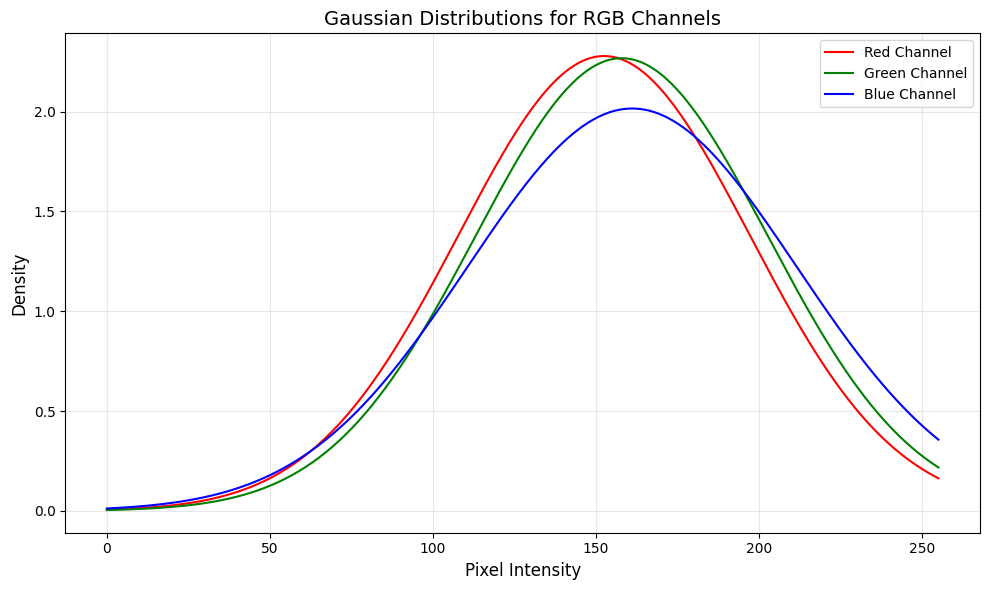

In [8]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def compute_mean_std(dataset_path):
    means = np.zeros(3)  # For RGB channels (R, G, B)
    stds = np.zeros(3)
    total_pixels = 0

    for root, dirs, files in os.walk(dataset_path):
        for file_name in files:
            file_path = os.path.join(root, file_name)
            try:
                with Image.open(file_path) as img:
                    img = img.convert("RGB")  # Ensure all images are RGB
                    img_array = np.array(img)  # Convert to NumPy array
                    img_array = img_array / 255.0  # Normalize to [0, 1]

                    # Compute stats for the current image
                    pixels = img_array.shape[0] * img_array.shape[1]
                    total_pixels += pixels

                    means += img_array.reshape(-1, 3).sum(axis=0)  # Sum over color channels
                    stds += (img_array.reshape(-1, 3) ** 2).sum(axis=0)
            except Exception as e:
                print(f"Error processing image {file_path}: {e}")

    # Compute final means and standard deviations
    means /= total_pixels
    stds = np.sqrt(stds / total_pixels - means**2)  # Variance = E[X^2] - (E[X])^2

    return means, stds

def plot_gaussian_distributions(mean, std):
    mean = list(mean)
    std = list(std)
    colors = ['red', 'green', 'blue']  # Colors for the RGB distributions
    labels = ['Red Channel', 'Green Channel', 'Blue Channel']

    # Generate x values for the Gaussian distributions
    x = np.linspace(0, 255, 500)  # Pixel intensity range

    plt.figure(figsize=(10, 6))

    # Plot each Gaussian distribution
    for mean_val, std_val, color, label in zip(mean, std, colors, labels):
        y = (1 / (std_val * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mean_val * 255) / (std_val * 255)) ** 2)
        plt.plot(x, y, color=color, label=label)

    # Add plot details
    plt.title('Gaussian Distributions for RGB Channels', fontsize=14)
    plt.xlabel('Pixel Intensity', fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.legend()
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

# Example usage
dataset_path = "/content/dataset/realwaste-main/RealWaste"  # Replace with your dataset path
mean, std = compute_mean_std(dataset_path)

print("Mean (R, G, B):", mean)
print("Standard Deviation (R, G, B):", std)

# Plot the Gaussian distributions
plot_gaussian_distributions(mean, std)


In [9]:
import os
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from PIL import Image

class WasteDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Args:
            root_dir (str): Directory with all the images, organized by subfolders for each class.
            transform (callable, optional): Optional transform to be applied on an image.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.image_paths = []
        self.labels = []

        # Collect image paths and labels
        for label_idx, class_name in enumerate(self.classes):
            class_dir = os.path.join(root_dir, class_name)
            for img_file in os.listdir(class_dir):
                self.image_paths.append(os.path.join(class_dir, img_file))
                self.labels.append(label_idx)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]

        with Image.open(img_path) as img:
            img = img.convert("RGB")  # Ensure RGB format
            if self.transform:
                img = self.transform(img)

        return img, label

# Define dataset paths
dataset_path = "/content/dataset/realwaste-main/RealWaste"

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to a fixed size
    transforms.ToTensor(),          # Convert image to PyTorch tensor and normalize to [0, 1]
    transforms.Normalize(mean, std) # Normalize using calculated mean and std
])

# Create the dataset
dataset = WasteDataset(dataset_path, transform=transform)

# Calculate split sizes
dataset_size = len(dataset)
train_size = int(0.6 * dataset_size)
val_size = int(0.2 * dataset_size)
test_size = dataset_size - train_size - val_size

# Split the dataset
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Print dataset sizes
print(f"Total dataset size: {dataset_size}")
print(f"Training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")


Total dataset size: 4752
Training set size: 2851
Validation set size: 950
Test set size: 951


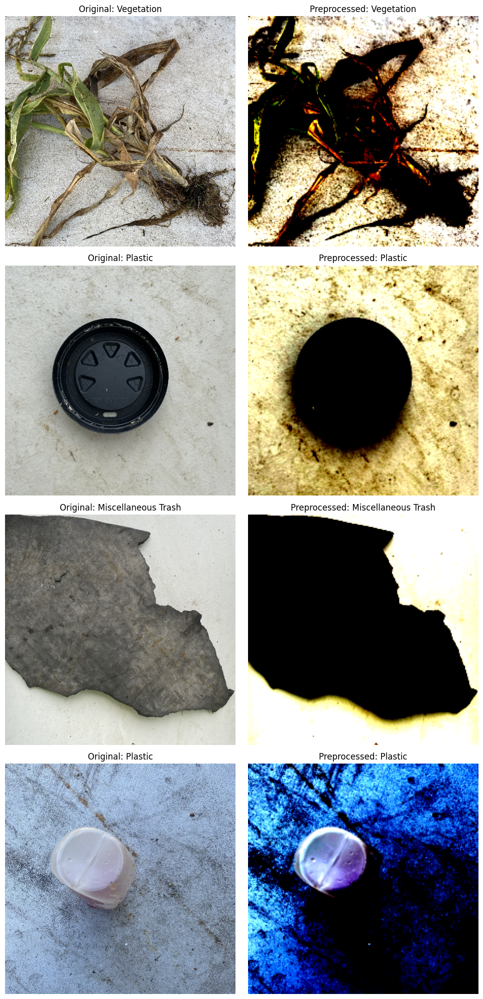

In [18]:
# Function to display original and preprocessed images
def visualize_random_images(dataset, num_images=4):
    fig, axes = plt.subplots(num_images, 2, figsize=(10, num_images * 5))
    axes = axes.flatten()

    # Select random indices from the dataset
    random_indices = random.sample(range(len(dataset)), num_images)

    for i, idx in enumerate(random_indices):
        img, label = dataset[idx]

        # Get the original image path and load the original image
        original_img_path = dataset.image_paths[idx]
        original_img = Image.open(original_img_path).convert("RGB")

        # Plot original image
        axes[i * 2].imshow(original_img)
        axes[i * 2].set_title(f"Original: {dataset.classes[label]}")
        axes[i * 2].axis('off')

        # Plot preprocessed image (transformed)
        axes[i * 2 + 1].imshow(img.permute(1, 2, 0))  # Convert from (C, H, W) to (H, W, C)
        axes[i * 2 + 1].set_title(f"Preprocessed: {dataset.classes[label]}")
        axes[i * 2 + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
visualize_random_images(dataset)

In [11]:
import torch.nn as nn
import torch.nn.functional as F

class EnhancedCNN(nn.Module):
    def __init__(self, num_classes):
        super(EnhancedCNN, self).__init__()

        # Convolutional layers
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # Input: (3, 224, 224) -> Output: (32, 224, 224)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1) # Input: (32, 224, 224) -> Output: (64, 112, 112)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)       # Pooling: -> Output: (64, 112, 112)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1) # Input: (64, 112, 112) -> Output: (128, 112, 112)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)# Input: (128, 112, 112) -> Output: (256, 56, 56)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)        # Pooling: -> Output: (256, 56, 56)

        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1) # Input: (256, 56, 56) -> Output: (512, 56, 56)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)         # Pooling: -> Output: (512, 28, 28)

        # Flatten layer
        self.flatten = nn.Flatten() # Output: 512 * 28 * 28 = 401408

        # Fully connected layers
        self.fc1 = nn.Linear(512 * 28 * 28, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, 256)
        self.dropout = nn.Dropout(0.5)  # Dropout for regularization
        self.fc4 = nn.Linear(256, num_classes)  # Output layer

    def forward(self, x):
        # Convolutional and pooling layers
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.pool1(x)

        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.pool2(x)

        x = F.relu(self.conv5(x))
        x = self.pool3(x)

        # Fully connected layers
        x = self.flatten(x)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = F.relu(self.fc3(x))
        x = self.fc4(x)

        return x

# Initialize model
num_classes = 9  # Number of classes
model = EnhancedCNN(num_classes)
print(model)


EnhancedCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=401408, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=512, bias=True)
  (fc3): Linear(in_features=512, out_features=256, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc4): Linear(in_features=256, out_features=9, bias=True)


Epoch 1/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.13it/s]


Epoch 1: Best model saved with validation loss: 1.8530
Epoch [1/20], Train Loss: 2.0083, Val Loss: 1.8530


Epoch 2/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.18it/s]


Epoch 2: Best model saved with validation loss: 1.5926
Epoch [2/20], Train Loss: 1.7116, Val Loss: 1.5926


Epoch 3/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.17it/s]


Epoch 3: Best model saved with validation loss: 1.3066
Epoch [3/20], Train Loss: 1.4567, Val Loss: 1.3066


Epoch 4/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.18it/s]


Epoch 4: Best model saved with validation loss: 1.1856
Epoch [4/20], Train Loss: 1.2828, Val Loss: 1.1856


Epoch 5/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.12it/s]


Epoch 5: Best model saved with validation loss: 1.1469
Epoch [5/20], Train Loss: 1.0917, Val Loss: 1.1469


Epoch 6/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.13it/s]


Epoch 6: Best model saved with validation loss: 1.1362
Epoch [6/20], Train Loss: 0.9684, Val Loss: 1.1362


Epoch 7/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.11it/s]


Epoch 7: Best model saved with validation loss: 1.1110
Epoch [7/20], Train Loss: 0.7792, Val Loss: 1.1110


Epoch 8/20 [Validation]: 100%|██████████| 30/30 [00:08<00:00,  3.42it/s]


Epoch [8/20], Train Loss: 0.6138, Val Loss: 1.1366


Epoch 9/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.13it/s]


Epoch [9/20], Train Loss: 0.4260, Val Loss: 1.4605


Epoch 10/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.11it/s]


Epoch [10/20], Train Loss: 0.5619, Val Loss: 1.2870


Epoch 11/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.31it/s]


Epoch [11/20], Train Loss: 0.2713, Val Loss: 1.3830


Epoch 12/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.15it/s]


Epoch [12/20], Train Loss: 0.2086, Val Loss: 1.4713


Epoch 13/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.09it/s]


Epoch [13/20], Train Loss: 0.1539, Val Loss: 1.7192


Epoch 14/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.23it/s]


Epoch [14/20], Train Loss: 0.1065, Val Loss: 2.1488


Epoch 15/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.32it/s]


Epoch [15/20], Train Loss: 0.1525, Val Loss: 1.9745


Epoch 16/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.12it/s]


Epoch [16/20], Train Loss: 0.1078, Val Loss: 1.8038


Epoch 17/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.14it/s]


Epoch [17/20], Train Loss: 0.1161, Val Loss: 2.4527


Epoch 18/20 [Validation]: 100%|██████████| 30/30 [00:08<00:00,  3.40it/s]


Epoch [18/20], Train Loss: 0.2485, Val Loss: 1.8929


Epoch 19/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.17it/s]


Epoch [19/20], Train Loss: 0.1386, Val Loss: 1.8355


Epoch 20/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.15it/s]
<ipython-input-19-cfc0e4e15d33>:73: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_

Epoch [20/20], Train Loss: 0.0932, Val Loss: 2.0208
Best model loaded with validation loss: 1.1110270003477731


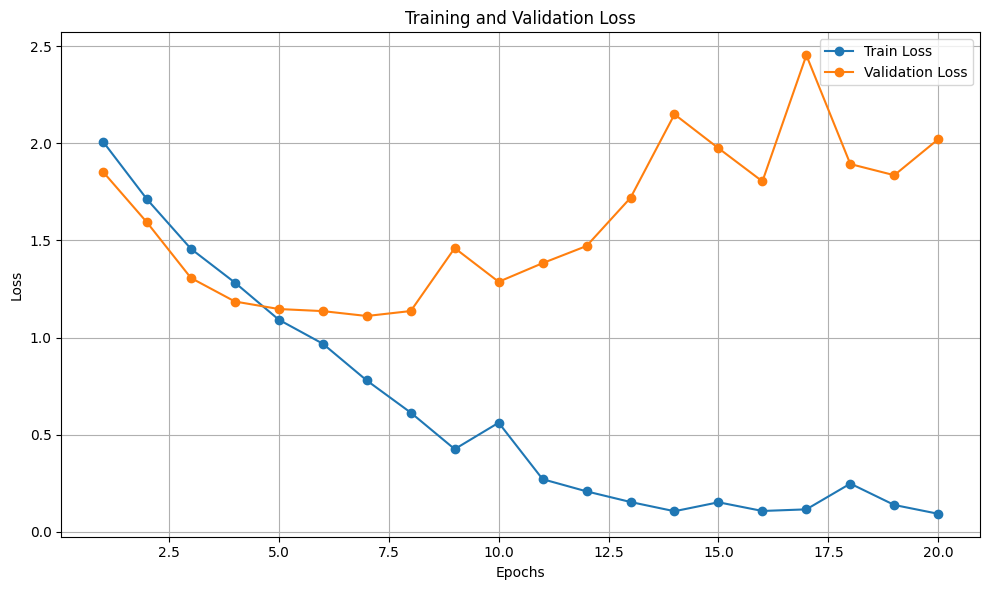

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from tqdm import tqdm

# Assuming the DataLoader and model setup is already complete
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters
num_epochs = 20
learning_rate = 0.001

# Define model, criterion, and optimizer
model = EnhancedCNN(num_classes=len(dataset.classes)).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Initialize variables to track training
best_val_loss = float('inf')
best_model_path = "best_model.pth"
train_losses = []
val_losses = []

# Training loop
for epoch in range(num_epochs):
    # Training phase
    model.train()
    train_loss = 0.0
    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]"):
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_loader)
    train_losses.append(train_loss)

    # Validation phase
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]"):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()

    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    # Save the best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        print(f"Epoch {epoch+1}: Best model saved with validation loss: {val_loss:.4f}")

    # Print losses
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

# After training, load the best model
model.load_state_dict(torch.load(best_model_path))
print("Best model loaded with validation loss:", best_val_loss)

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss", marker='o')
plt.plot(range(1, num_epochs + 1), val_losses, label="Validation Loss", marker='o')
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


In [12]:
class EnhancedCNNImproved(nn.Module):
    def __init__(self, num_classes):
        super(EnhancedCNNImproved, self).__init__()

        # Convolutional layers with BatchNorm
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Global Average Pooling
        self.global_pool = nn.AdaptiveAvgPool2d(1)

        # Fully connected layers
        self.fc1 = nn.Linear(512, 256)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.pool1(x)

        x = F.relu(self.bn3(self.conv3(x)))
        x = F.relu(self.bn4(self.conv4(x)))
        x = self.pool2(x)

        x = F.relu(self.bn5(self.conv5(x)))
        x = self.pool3(x)

        x = self.global_pool(x)
        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)

        return x

num_classes = 9  # Number of classes
model = EnhancedCNNImproved(num_classes)
print(model)


EnhancedCNNImproved(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv5): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn5): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=Tr

Epoch 1/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.28it/s]


Epoch 1: Best model saved with validation loss: 1.3852
Epoch [1/20], Train Loss: 1.6770, Val Loss: 1.3852


Epoch 2/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.07it/s]


Epoch [2/20], Train Loss: 1.4365, Val Loss: 1.4589


Epoch 3/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.06it/s]


Epoch [3/20], Train Loss: 1.3306, Val Loss: 1.4830


Epoch 4/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.10it/s]


Epoch 4: Best model saved with validation loss: 1.2419
Epoch [4/20], Train Loss: 1.3146, Val Loss: 1.2419


Epoch 5/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]


Epoch [5/20], Train Loss: 1.1998, Val Loss: 1.3768


Epoch 6/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.06it/s]


Epoch 6: Best model saved with validation loss: 1.0782
Epoch [6/20], Train Loss: 1.1929, Val Loss: 1.0782


Epoch 7/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.11it/s]


Epoch [7/20], Train Loss: 1.1266, Val Loss: 1.1278


Epoch 8/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.22it/s]


Epoch 8: Best model saved with validation loss: 1.0681
Epoch [8/20], Train Loss: 1.1358, Val Loss: 1.0681


Epoch 9/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.19it/s]


Epoch [9/20], Train Loss: 1.1241, Val Loss: 1.3669


Epoch 10/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.11it/s]


Epoch 10: Best model saved with validation loss: 1.0097
Epoch [10/20], Train Loss: 1.1036, Val Loss: 1.0097


Epoch 11/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.11it/s]


Epoch [11/20], Train Loss: 1.0493, Val Loss: 1.0865


Epoch 12/20 [Validation]: 100%|██████████| 30/30 [00:08<00:00,  3.37it/s]


Epoch [12/20], Train Loss: 1.0343, Val Loss: 1.0234


Epoch 13/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.10it/s]


Epoch [13/20], Train Loss: 0.9963, Val Loss: 1.1464


Epoch 14/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.03it/s]


Epoch 14: Best model saved with validation loss: 1.0072
Epoch [14/20], Train Loss: 1.0166, Val Loss: 1.0072


Epoch 15/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.08it/s]


Epoch 15: Best model saved with validation loss: 0.9441
Epoch [15/20], Train Loss: 0.9898, Val Loss: 0.9441


Epoch 16/20 [Validation]: 100%|██████████| 30/30 [00:08<00:00,  3.34it/s]


Epoch 16: Best model saved with validation loss: 0.8935
Epoch [16/20], Train Loss: 1.0075, Val Loss: 0.8935


Epoch 17/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.13it/s]


Epoch [17/20], Train Loss: 0.9687, Val Loss: 0.9908


Epoch 18/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.10it/s]


Epoch [18/20], Train Loss: 0.9519, Val Loss: 0.9651


Epoch 19/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.22it/s]


Epoch [19/20], Train Loss: 0.9311, Val Loss: 0.9501


Epoch 20/20 [Validation]: 100%|██████████| 30/30 [00:09<00:00,  3.11it/s]
<ipython-input-23-8f6e05a3d755>:73: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_

Epoch 20: Best model saved with validation loss: 0.8676
Epoch [20/20], Train Loss: 0.9340, Val Loss: 0.8676
Best model loaded with validation loss: 0.8675706505775451


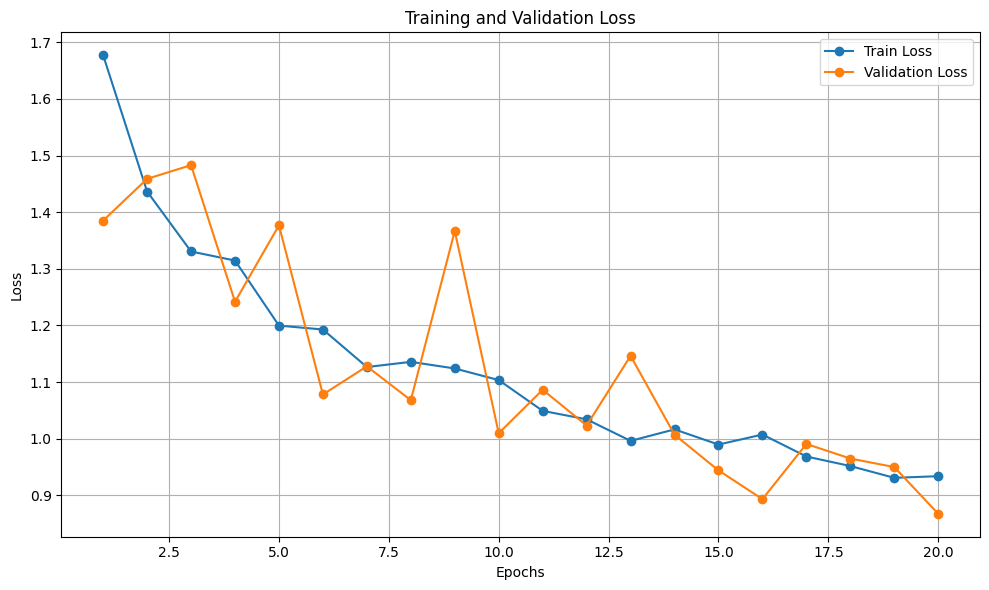

In [23]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from tqdm import tqdm

# Assuming the DataLoader and model setup is already complete
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters
num_epochs = 20
learning_rate = 0.001

# Define model, criterion, and optimizer
model = EnhancedCNNImproved(num_classes=len(dataset.classes)).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Initialize variables to track training
best_val_loss = float('inf')
best_model_path = "best_model.pth"
train_losses = []
val_losses = []

# Training loop
for epoch in range(num_epochs):
    # Training phase
    model.train()
    train_loss = 0.0
    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]"):
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_loader)
    train_losses.append(train_loss)

    # Validation phase
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]"):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()

    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    # Save the best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        print(f"Epoch {epoch+1}: Best model saved with validation loss: {val_loss:.4f}")

    # Print losses
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

# After training, load the best model
model.load_state_dict(torch.load(best_model_path))
print("Best model loaded with validation loss:", best_val_loss)

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss", marker='o')
plt.plot(range(1, num_epochs + 1), val_losses, label="Validation Loss", marker='o')
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

Using device: cuda


<ipython-input-24-7851bf3a7889>:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth', map_location=device))  # Map weights to 

Test Accuracy of the model: 64.56%


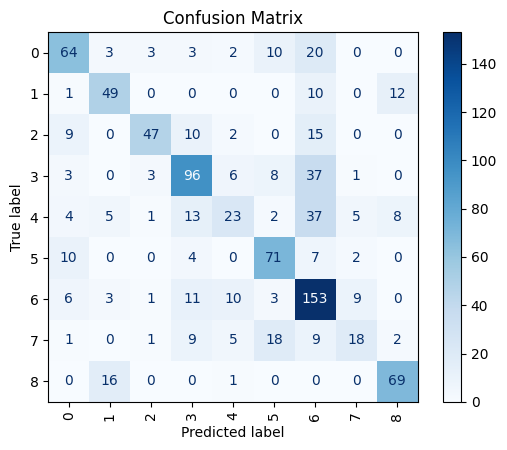

Precision: 0.66
Recall: 0.65


In [24]:
import torch
import numpy as np
from sklearn.metrics import confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load the best model weights and move the model to the appropriate device
model = EnhancedCNNImproved(num_classes=len(dataset.classes))  # Ensure the same architecture as the saved model
model.load_state_dict(torch.load('best_model.pth', map_location=device))  # Map weights to the current device
model.to(device)  # Move model to the selected device
model.eval()  # Set the model to evaluation mode

# Initialize variables for accuracy calculation
correct = 0
total = 0
all_labels = []
all_predictions = []

# Disable gradient computation for evaluation
with torch.no_grad():
    for images, labels in test_loader:  # Iterate through the test DataLoader
        images, labels = images.to(device), labels.to(device)  # Move data to the same device as the model

        # Forward pass: Get predictions
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)  # Get the class with the highest score

        # Update counts
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Store labels and predictions for metrics
        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())

# Calculate accuracy
accuracy = 100 * correct / total
print(f"Test Accuracy of the model: {accuracy:.2f}%")

## Compute confusion matrix
#conf_matrix = confusion_matrix(all_labels, all_predictions)
#print("Confusion Matrix:")
#print(conf_matrix)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=range(num_classes))
disp.plot(cmap='Blues', xticks_rotation='vertical')
plt.title("Confusion Matrix")
plt.show()

# Calculate precision and recall
precision = precision_score(all_labels, all_predictions, average='weighted')
recall = recall_score(all_labels, all_predictions, average='weighted')
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")



Training with learning rate: 0.0001


Epoch 1/5 [Validation] (LR: 0.0001): 100%|██████████| 30/30 [00:09<00:00,  3.09it/s]


Epoch [1/5], Train Loss: 1.7518, Val Loss: 1.4907


Epoch 2/5 [Validation] (LR: 0.0001): 100%|██████████| 30/30 [00:09<00:00,  3.01it/s]


Epoch [2/5], Train Loss: 1.4356, Val Loss: 1.3278


Epoch 3/5 [Validation] (LR: 0.0001): 100%|██████████| 30/30 [00:09<00:00,  3.16it/s]


Epoch [3/5], Train Loss: 1.3398, Val Loss: 1.2255


Epoch 4/5 [Validation] (LR: 0.0001): 100%|██████████| 30/30 [00:09<00:00,  3.14it/s]


Epoch [4/5], Train Loss: 1.2718, Val Loss: 1.1661


Epoch 5/5 [Validation] (LR: 0.0001): 100%|██████████| 30/30 [00:09<00:00,  3.09it/s]


Epoch [5/5], Train Loss: 1.2135, Val Loss: 1.1337

Training with learning rate: 0.001


Epoch 1/5 [Validation] (LR: 0.001): 100%|██████████| 30/30 [00:09<00:00,  3.03it/s]


Epoch [1/5], Train Loss: 1.6625, Val Loss: 1.4001


Epoch 2/5 [Validation] (LR: 0.001): 100%|██████████| 30/30 [00:09<00:00,  3.09it/s]


Epoch [2/5], Train Loss: 1.4149, Val Loss: 1.3215


Epoch 3/5 [Validation] (LR: 0.001): 100%|██████████| 30/30 [00:09<00:00,  3.01it/s]


Epoch [3/5], Train Loss: 1.3416, Val Loss: 1.2797


Epoch 4/5 [Validation] (LR: 0.001): 100%|██████████| 30/30 [00:09<00:00,  3.00it/s]


Epoch [4/5], Train Loss: 1.3144, Val Loss: 1.2124


Epoch 5/5 [Validation] (LR: 0.001): 100%|██████████| 30/30 [00:09<00:00,  3.10it/s]


Epoch [5/5], Train Loss: 1.2625, Val Loss: 1.3465

Training with learning rate: 0.01


Epoch 1/5 [Validation] (LR: 0.01): 100%|██████████| 30/30 [00:09<00:00,  3.12it/s]


Epoch [1/5], Train Loss: 2.1771, Val Loss: 2.0462


Epoch 2/5 [Validation] (LR: 0.01): 100%|██████████| 30/30 [00:09<00:00,  3.19it/s]


Epoch [2/5], Train Loss: 1.9873, Val Loss: 1.8932


Epoch 3/5 [Validation] (LR: 0.01): 100%|██████████| 30/30 [00:09<00:00,  3.08it/s]


Epoch [3/5], Train Loss: 1.9638, Val Loss: 1.8441


Epoch 4/5 [Validation] (LR: 0.01): 100%|██████████| 30/30 [00:09<00:00,  3.08it/s]


Epoch [4/5], Train Loss: 1.8956, Val Loss: 1.8591


Epoch 5/5 [Validation] (LR: 0.01): 100%|██████████| 30/30 [00:09<00:00,  3.26it/s]


Epoch [5/5], Train Loss: 1.8409, Val Loss: 1.7525

Training with learning rate: 0.1


Epoch 1/5 [Validation] (LR: 0.1): 100%|██████████| 30/30 [00:09<00:00,  3.05it/s]


Epoch [1/5], Train Loss: 5.2085, Val Loss: 2.1508


Epoch 2/5 [Validation] (LR: 0.1): 100%|██████████| 30/30 [00:09<00:00,  3.11it/s]


Epoch [2/5], Train Loss: 2.1504, Val Loss: 2.1621


Epoch 3/5 [Validation] (LR: 0.1): 100%|██████████| 30/30 [00:09<00:00,  3.08it/s]


Epoch [3/5], Train Loss: 2.1504, Val Loss: 2.1676


Epoch 4/5 [Validation] (LR: 0.1): 100%|██████████| 30/30 [00:10<00:00,  2.98it/s]


Epoch [4/5], Train Loss: 2.1524, Val Loss: 2.1759


Epoch 5/5 [Validation] (LR: 0.1): 100%|██████████| 30/30 [00:09<00:00,  3.23it/s]


Epoch [5/5], Train Loss: 2.1546, Val Loss: 2.1566


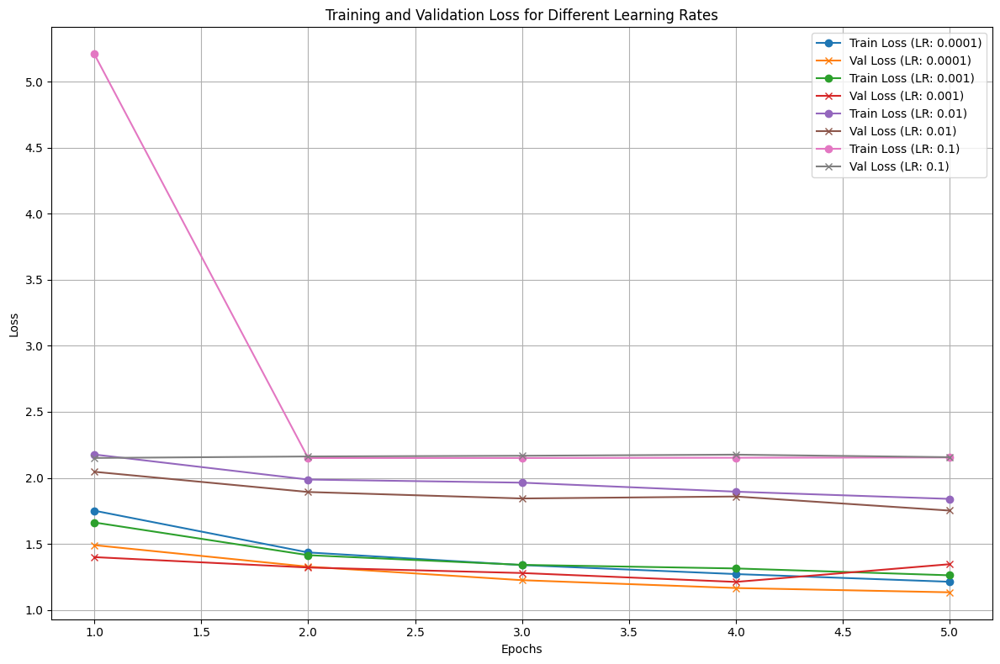

Learning Rate: 0.0001
  Final Train Loss: 1.2135
  Final Val Loss: 1.1337
Learning Rate: 0.001
  Final Train Loss: 1.2625
  Final Val Loss: 1.3465
Learning Rate: 0.01
  Final Train Loss: 1.8409
  Final Val Loss: 1.7525
Learning Rate: 0.1
  Final Train Loss: 2.1546
  Final Val Loss: 2.1566


In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from tqdm import tqdm

# Assuming DataLoader and model setup is already complete
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters
num_epochs = 5
learning_rates = [0.0001, 0.001, 0.01, 0.1]

# Track losses for each learning rate
lr_results = {}

for lr in learning_rates:
    print(f"\nTraining with learning rate: {lr}")

    # Define model, criterion, and optimizer
    model = EnhancedCNNImproved(num_classes=len(dataset.classes)).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    # Initialize variables to track training
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training] (LR: {lr})"):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        # Validation phase
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Validation] (LR: {lr})"):
                images, labels = images.to(device), labels.to(device)

                # Forward pass
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        # Print losses
        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

    # Save results for this learning rate
    lr_results[lr] = {
        "train_losses": train_losses,
        "val_losses": val_losses
    }

# Plot training and validation loss for all learning rates
plt.figure(figsize=(12, 8))
for lr, results in lr_results.items():
    plt.plot(range(1, num_epochs + 1), results["train_losses"], label=f"Train Loss (LR: {lr})", marker='o')
    plt.plot(range(1, num_epochs + 1), results["val_losses"], label=f"Val Loss (LR: {lr})", marker='x')

plt.title("Training and Validation Loss for Different Learning Rates")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# Comment on results
for lr, results in lr_results.items():
    print(f"Learning Rate: {lr}")
    print(f"  Final Train Loss: {results['train_losses'][-1]:.4f}")
    print(f"  Final Val Loss: {results['val_losses'][-1]:.4f}")



# **2 Compare network with state-of-the-art networks**

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 170MB/s]
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed i


Training ResNet18...

Epoch [1/10], Train Loss: 1.1573, Val Loss: 1.0406
Epoch [2/10], Train Loss: 0.8030, Val Loss: 1.5941
Epoch [3/10], Train Loss: 0.6662, Val Loss: 0.9012
Epoch [4/10], Train Loss: 0.5003, Val Loss: 0.9113
Epoch [5/10], Train Loss: 0.3647, Val Loss: 0.8639
Epoch [6/10], Train Loss: 0.3048, Val Loss: 0.6930
Epoch [7/10], Train Loss: 0.2531, Val Loss: 1.0629
Epoch [8/10], Train Loss: 0.1972, Val Loss: 0.7525
Epoch [9/10], Train Loss: 0.2410, Val Loss: 1.3865
Epoch [10/10], Train Loss: 0.1384, Val Loss: 1.1576

Training VGG16...

Epoch [1/10], Train Loss: 2.1111, Val Loss: 1.7963
Epoch [2/10], Train Loss: 1.6690, Val Loss: 1.7592
Epoch [3/10], Train Loss: 1.5403, Val Loss: 1.4996
Epoch [4/10], Train Loss: 1.4093, Val Loss: 1.3751
Epoch [5/10], Train Loss: 1.2981, Val Loss: 1.4077
Epoch [6/10], Train Loss: 1.1694, Val Loss: 1.1760
Epoch [7/10], Train Loss: 1.0838, Val Loss: 1.1804
Epoch [8/10], Train Loss: 1.0184, Val Loss: 1.2295
Epoch [9/10], Train Loss: 0.9448, Val 

<ipython-input-16-d8be732c72e3>:83: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"{model_name}_best.pth"))


ResNet18 Test Accuracy: 72.87%
VGG16 Test Accuracy: 60.67%


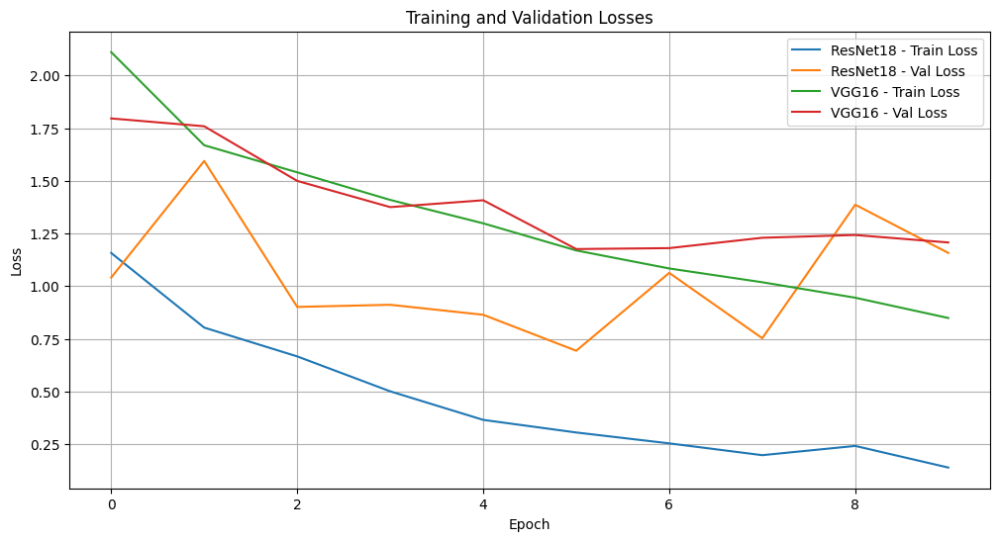


Final Test Accuracies:
ResNet18: 72.87%
VGG16: 60.67%


In [16]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader

# Define the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Number of classes
num_classes = len(dataset.classes)

# Load pre-trained models
models_to_train = {
    "ResNet18": models.resnet18(pretrained=True),
    "VGG16": models.vgg16(pretrained=True)
}

# Modify the last layer for the number of classes
for model_name, model in models_to_train.items():
    if model_name == "ResNet18":
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "VGG16":
        model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, num_classes)
    model.to(device)

# Training parameters
num_epochs = 10
criterion = nn.CrossEntropyLoss()
batch_size = 32
learning_rate = 0.001


# Train and validate each model
results = {}
for model_name, model in models_to_train.items():
    print(f"\nTraining {model_name}...\n")

    # Optimizer
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Record losses
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        # Training
        model.train()
        running_loss = 0.0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        train_losses.append(running_loss / len(train_loader))

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
        val_losses.append(val_loss / len(val_loader))

        print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}")

    # Save the training and validation losses
    results[model_name] = {"train_losses": train_losses, "val_losses": val_losses}

    # Save the best model
    torch.save(model.state_dict(), f"{model_name}_best.pth")

# Evaluate models on the test set
test_accuracies = {}
for model_name, model in models_to_train.items():
    # Load the best model
    model.load_state_dict(torch.load(f"{model_name}_best.pth"))
    model.eval()

    # Test accuracy
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    accuracy = 100 * correct / total
    test_accuracies[model_name] = accuracy
    print(f"{model_name} Test Accuracy: {accuracy:.2f}%")

# Plot training and validation losses
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
for model_name, data in results.items():
    plt.plot(data["train_losses"], label=f"{model_name} - Train Loss")
    plt.plot(data["val_losses"], label=f"{model_name} - Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Losses")
plt.legend()
plt.grid()
plt.show()

# Print final test accuracies
print("\nFinal Test Accuracies:")
for model_name, accuracy in test_accuracies.items():
    print(f"{model_name}: {accuracy:.2f}%")
